## LAB 2 Panoramic-JWST Field Analysis - Turn this notebook in, with plots and answers

Following a number of initial experiments and tests, this is the 'official' lab notebook to turn in.  There are four main sections, with associated questions.

**Sections**
1. ***Model***: Generate simulated spectra and photometry for JWST NIRCAM bandpasses
2. ***Analysis I:*** NIR stellar photometry in the LMC. Extract aperture photometry from LMC field (panoramic-j043844m684), generate color-magnitude and color-color diagrams, and compare with simulated outputs
3. ***Analysis II:*** NIR galaxy source detection in a medium-deep blank sky field. Extract source and aperture photometry from blank sky field (in SSA22 region), generate basic diagnostic plots and answer questions re: implications (field: panoramic-j221700p0025)
4. ***Visual inspection and population estimates:*** Search for AGN, merging and disturbed galaxies in a medium-deep blank sky field (panoramic-j221700p0025)





## Section 1: Models for stars and galaxies

The goal of this section is to generate or obtain model synthetic photometry for use in comparison with the JWST NIRCAM photometry.  

The stars we detect in the LMC will be broadly characterized by the age and metallicity of the stellar population in that region which will have a range of stellar masses, temperature and radii. 

We will first generate a simple model to compare with our JWST NIRCAM color-color and color-magnitude plots, assuming 


Steps are:

* import the JWST filter curves
* Generate blackblody spectra for stars of different temperatures and radii and predict magnitudes for filter bands
* Ingest stellar isochrone models from MIST
* Generate a separate set of models for galaxies


In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

from astropy import units as u
from astropy.io import fits

# For obtaining filter curves from Filter Service (seems to be back online)
from astroquery.svo_fps import SvoFps
from synphot import Observation, SourceSpectrum
from specutils import Spectrum1D
from synphot import SpectralElement
from synphot.models import Empirical1D
from synphot.models import BlackBodyNorm1D
from synphot import SourceSpectrum
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.patches import Ellipse
import sep
import warnings
from astropy.table import QTable
warnings.filterwarnings("ignore")

plt.rcParams.update(
    {
        "text.usetex": True,
        # "font.family": "Helvetica",
        "font.family": "serif",
        "mathtext.fontset": "cm",
        "xtick.labelsize": 10,
        "ytick.labelsize": 10,
        "font.size": 11,
        "xtick.direction": "in",
        "ytick.direction": "in",
        "ytick.right": True,
        "xtick.top": True,
        "xtick.major.size": 6,
        "ytick.major.size": 6,
        "xtick.minor.size": 4,
        "ytick.minor.size": 4,
        'xtick.minor.visible': True,
        "ytick.minor.visible": True,
    }
)



We will use the synphot package to generate spectra, and 'observe' them through JWST filter bandpasses. Before we get started, the example below shows the spectrum of Vega, normalized to the zeropoint of the AB magnitude system.

<function matplotlib.pyplot.show(close=None, block=None)>

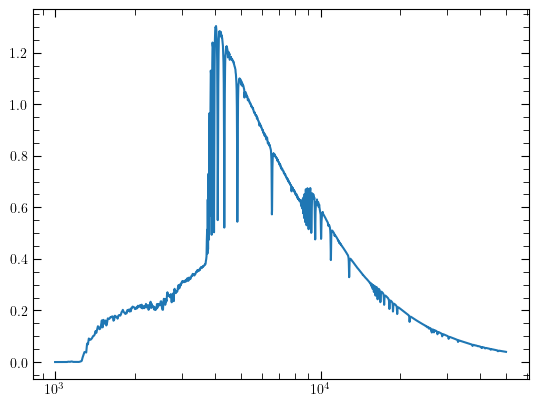

In [2]:
sp = SourceSpectrum.from_vega()

wave = range(1000, 50000, 10)
flux = sp(wave, flux_unit="Jy")
plt.plot(wave, flux / 3631)
plt.xscale("log")
plt.show

In [3]:
wavelength_range = np.array([1e4, 1e5]) * u.AA
# wein's law
t_range = 2.898e-3 / wavelength_range.to(u.m).value
print("temperature range of nircam [K]", t_range)

temperature range of nircam [K] [2898.   289.8]


### 1.1. Read Filter Curves:
The cell below simply imports JWST filter curves

**Question**: What is the temperature range of blackbodies that have spectral peaks in or near the NIRCAM filter band wavelengths? 

> __Answer__: The temperature range for emitting in the NIRCAM bands at restframe is around 300K to 3000K, note that objects are often hotter due to the fact that they are emitted at higher redshift, so redshift correction is in need (i.e., they are emitted at UV). But this is redshift dependent.

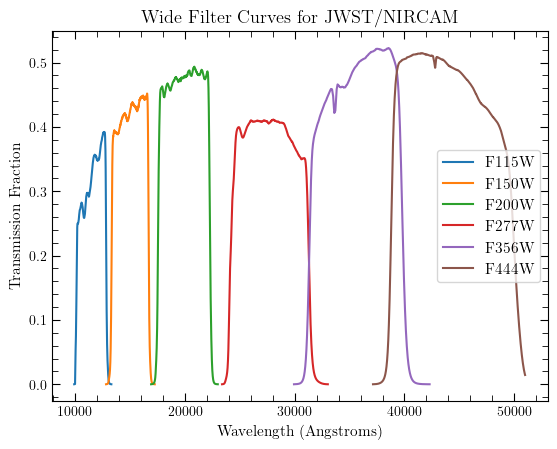

In [4]:
# Obtain filter curves from filter service

filter_list = SvoFps.get_filter_list(facility="JWST", instrument="NIRCAM")
filtstr = ["F115W", "F150W", "F200W", "F277W", "F356W", "F444W"]

filter_data = {}
for filter in filtstr:
    data = SvoFps.get_transmission_data("JWST/NIRCam." + filter)
    plt.plot(data["Wavelength"], data["Transmission"], label=filter)
    filter_data[filter] = data
plt.xlabel("Wavelength (Angstroms)")
plt.ylabel("Transmission Fraction")
plt.title("Wide Filter Curves for JWST/NIRCAM")
plt.legend()
plt.show()

In [5]:
filter_data

{'F115W': <Table length=340>
 Wavelength Transmission
     AA                 
  float64     float64   
 ---------- ------------
     9892.0  0.000116806
     9902.0  0.000139915
     9912.0  0.000165642
     9922.0  0.000194668
     9932.0  0.000227798
     9942.0  0.000266434
     9952.0  0.000312148
     9962.0  0.000369172
     9972.0  0.000442097
        ...          ...
    13192.0  0.000370328
    13202.0   0.00031819
    13212.0  0.000275166
    13222.0  0.000238961
    13232.0  0.000208668
    13242.0  0.000182193
    13252.0  0.000159002
    13262.0  0.000139811
    13272.0  0.000122979
    13282.0  0.000108655,
 'F150W': <Table length=445>
 Wavelength Transmission
     AA                 
  float64     float64   
 ---------- ------------
    12797.9  0.000114018
    12807.9  0.000130904
    12817.9  0.000150553
    12827.9   0.00017276
    12837.9  0.000198265
    12847.9  0.000227338
    12857.9  0.000261516
    12867.9  0.000302631
    12877.9  0.000346276
        ...     

### 1.2. Magnitude grids for stellar blackbodies:
Use the below code as a starting point to calculate ~5x4 grids of predicted AB magnitudes for each of the 6 NIRCAM bands for blackbodies at the distance of the LMC. Use a range of temperatures (e.g. 500, 1000, 2000, 4000, 8000 K) and radii (e.g. 0.25, 0.5, 1, 2 solar). 

In [6]:
# normalized to a star of 1 solar radius at a distance of 1 kpc.
# https://synphot.readthedocs.io/en/latest/api/synphot.models.BlackBodyNorm1D.html
# radius = 1.0  # Solar radius  vary for stars of different radii
# distance = 1.0  # kpc    e.g. CHANGE FOR LMC DISTANCE
# temperature = 5500  #  Vary for stars of different temperatures
# bb1d = BlackBodyNorm1D()
# waverange = range(1000, 50000)
# flux = bb1d.evaluate(x=waverange, temperature=temperature) * (radius / distance) ** 2
# em = SourceSpectrum(Empirical1D, points=waverange, lookup_table=flux, keep_neg=True)
# # Generate a synphot bandpass using 1D filter throughput data
# filt = filter_data["F150W"]
# bp = SpectralElement(
#     Empirical1D,
#     points=filt["Wavelength"],
#     lookup_table=filt["Transmission"],
#     keep_neg=True,
# )
# # print(bp.check_overlap(em))   # Run this check if concern about spectral overlap
# obs = Observation(em, bp, force="extrap", binset=filt["Wavelength"])

# print(obs.effstim(u.ABmag))

radii = [0.25, 0.5, 1.0, 2.0]  # R_solar
temperatures = [500, 1e3, 2e3, 4e3, 8e3]  # K
waverange = range(1000, 50000)  # Angstroms
# 50 kpc, https://www.aanda.org/articles/aa/pdf/2009/11/aa11029-08.pdf
distance = 50

mag_grids = {}
for f in filtstr:
    for r in radii:
        for t in temperatures:
            bb1d = BlackBodyNorm1D()
            #
            flux = bb1d.evaluate(x=waverange, temperature=t) * (r / distance) ** 2
            em = SourceSpectrum(
                Empirical1D, points=waverange, lookup_table=flux, keep_neg=True
            )
            filt = filter_data[f]
            bp = SpectralElement(
                Empirical1D,
                points=filt["Wavelength"],
                lookup_table=filt["Transmission"],
                keep_neg=True,
            )
            # print(bp.check_overlap(em))   # Run this check if concern about spectral overlap
            obs = Observation(em, bp, force="extrap", binset=filt["Wavelength"])
            mag_grids[(f, r, t)] = obs.effstim(u.ABmag).value
            # print(obs.effstim(u.ABmag))

In [7]:
mag_grids

{('F115W', 0.25, 500): 43.53382552150553,
 ('F115W', 0.25, 1000.0): 37.10743908949661,
 ('F115W', 0.25, 2000.0): 30.63085548102854,
 ('F115W', 0.25, 4000.0): 27.207099322055836,
 ('F115W', 0.25, 8000.0): 25.29325430701627,
 ('F115W', 0.5, 500): 42.02867554318562,
 ('F115W', 0.5, 1000.0): 35.6022891111767,
 ('F115W', 0.5, 2000.0): 29.125705502708634,
 ('F115W', 0.5, 4000.0): 25.70194934373593,
 ('F115W', 0.5, 8000.0): 23.788104328696367,
 ('F115W', 1.0, 500): 40.523525564865714,
 ('F115W', 1.0, 1000.0): 34.097139132856796,
 ('F115W', 1.0, 2000.0): 27.620555524388728,
 ('F115W', 1.0, 4000.0): 24.196799365416023,
 ('F115W', 1.0, 8000.0): 22.28295435037646,
 ('F115W', 2.0, 500): 39.0183755865458,
 ('F115W', 2.0, 1000.0): 32.59198915453689,
 ('F115W', 2.0, 2000.0): 26.11540554606882,
 ('F115W', 2.0, 4000.0): 22.691649387096117,
 ('F115W', 2.0, 8000.0): 20.777804372056554,
 ('F150W', 0.25, 500): 43.53445589111945,
 ('F150W', 0.25, 1000.0): 35.06695678959653,
 ('F150W', 0.25, 2000.0): 29.9264

In [8]:
for f in filtstr:
    for r in radii:
        for t in temperatures:
            print(mag_grids[(f, r, t)])

43.53382552150553
37.10743908949661
30.63085548102854
27.207099322055836
25.29325430701627
42.02867554318562
35.6022891111767
29.125705502708634
25.70194934373593
23.788104328696367
40.523525564865714
34.097139132856796
27.620555524388728
24.196799365416023
22.28295435037646
39.0183755865458
32.59198915453689
26.11540554606882
22.691649387096117
20.777804372056554
43.53445589111945
35.06695678959653
29.926461502002468
27.221283596208544
25.62120411382224
42.02930591279954
33.561806811276625
28.42131152368256
25.716133617888637
24.116054135502335
40.52415593447964
32.05665683295672
26.916161545362655
24.21098363956873
22.61090415718243
39.019005956159724
30.551506854636816
25.41101156704275
22.705833661248825
21.105754178862522
41.05268103039349
33.483772319258904
29.54640972512717
27.403849883248938
26.040918298556058
39.54753105207358
31.978622340939
28.041259746807263
25.898699904929032
24.53576832023615
38.042381073753674
30.473472362619095
26.536109768487357
24.393549926609126
23.0

### 1.3 Read and plot MIST models of stellar isochrones

Using the MIST code, we have generated stellar isochrone models.  These are models of the predicted spectra and derived photometric magnitudes, for stars of a given metallicity, typically calculated over a grid of ages and masses.  These can then be used to compare with stellar color-magnitude and color-color plots.

The below code reads in these models.

A few notes:
* The MIST code generates magnitudes in the Vega system.  The vega2AB array below provides the conversion from Vega to AB, but these conversion factors can also be calculated using the Vega spectrum above
* Ages are expressed in log yr, and the file has been calculated at log ages shown below
* The model metallicity is [Fe/H] = -0.38, which reflects the lower mean metallicity of the Large Magellanic Cloud
* The isochrones include all phases of stellar evolution, but it is often useful to restrict the data to only the main sequence and giant branch phases (no WD).  MIST captures this with a quantity 'phase'

The MIST file was generated here: https://waps.cfa.harvard.edu/MIST/interp_isos.html




In [9]:
plt.rcParams.update(
    {
        "text.usetex": True,
        # "font.family": "Helvetica",
        "font.family": "serif",
        "mathtext.fontset": "cm",
        "xtick.labelsize": 7,
        "ytick.labelsize": 7,
        "font.size": 7,
        "xtick.direction": "in",
        "ytick.direction": "in",
        "ytick.right": True,
        "xtick.top": True,
        "xtick.major.size": 6,
        "ytick.major.size": 6,
        "xtick.minor.size": 4,
        "ytick.minor.size": 4,
        "xtick.minor.visible": True,
        "ytick.minor.visible": True,
    }
)

### To do: Plot isochrones in NIRCAM color-magnitude and color-color space (for LMC)

Make a set of plots showing isochrones for different ages (e.g. log age = 8.0, 8.5, 9, 9.5, 10)

**Question:** Are there colors that show more variation across the stellar population?  (At which stellar masses might we see bends in the CMD or color-color space, especially in the main sequence).

* This is an open-ended question, so you might want to answer by picking a single age for exploring this. The LMC age is likely to be young-intermediate age.
* Restrict the data to phase < 3

> Answer: In the figure below, each panel contains a unique (x-y) pairing between two of the 6 filters for NIRCAM (where x!=y). In each panel, we show the log age across all ages mentioned above. Through inspection, I would say that the the lower band filters (e.g., F115W and F150W) show more variations across the poluations. By variation, I'm mostly just thinking about the spread in the x and y axis. This also appears to be the case for the color-color plot below. Note, in the way the we plotted it here, there are isochrones that are simply flipped. The 100 Myr isochrone (blue) is quite spread out. In terms of the bends, it's usually where it departs from the main sequence. The red giant branch usually extends from 0.4 - 12 Msun. 


Reading in: MIST_iso_6712533c7986e.iso.cmd


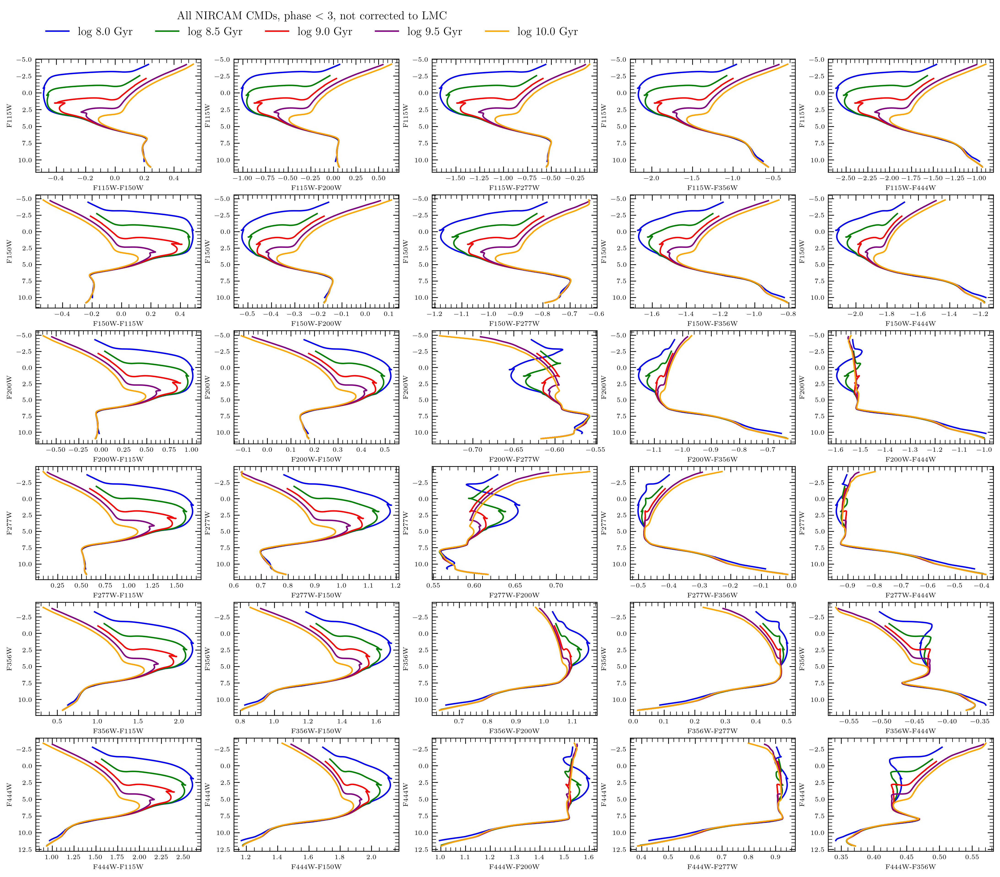

In [13]:
import read_mist_models

# print("version: ", isocmd.version)
# print("abundances: ", isocmd.abun)
# print("rotation: ", isocmd.rot)
# print("ages: ", [round(x, 2) for x in isocmd.ages])
# print("number of ages: ", isocmd.num_ages)
# print("available columns: ", isocmd.hdr_list)

mist_synthetic_cmd = "MIST_iso_6712533c7986e.iso.cmd"
isocmd = read_mist_models.ISOCMD(mist_synthetic_cmd)
# ["F115W", "F150W", "F200W", "F277W", "F356W", "F444W"]
vega2AB = np.array([0.78, 1.21, 1.68, 2.30, 2.78, 3.21])  # for the 6 JWST Filters
distance_lmc = 50e3  # kpc
log_ages = [8.0, 8.5, 9.0, 9.5, 10.0]
colors = ["blue", "green", "red", "purple", "orange"]
dist_modulus = 5 * np.log10(distance_lmc) - 5
fig, ax = plt.subplots(6, 5, figsize=(18, 15), dpi=300)
row = 0
for i in range(6):  # 6 filters
    col = 0
    for j in range(6):
        if i != j:  # Exclude pairs where x == y
            f1 = i
            f2 = j
            # print(f1, f2)

            for c, age in enumerate(log_ages):

                age_ind = isocmd.age_index(age)  # returns the index for the desired age

                F1_AB = isocmd.isocmds[age_ind][filtstr[f1]] + vega2AB[f1]
                F2_AB = isocmd.isocmds[age_ind][filtstr[f2]] + vega2AB[f2]

                p = np.where(isocmd.isocmds[age_ind]["phase"] < 3)[0]

                ax[row, col].plot(
                    F1_AB[p] - F2_AB[p],
                    F1_AB[p],
                    color=colors[c],
                    label=f"log {age} Gyr",
                )
                ax[row, col].set(
                    xlabel=filtstr[f1] + "-" + filtstr[f2],
                    ylabel=filtstr[f1],
                    # ylim=(14, 32),
                    # xlim = (-1, 1),
                )
                ax[row, col].invert_yaxis()
                if row == 0 and col == 0:
                    ax[row, col].legend(
                        bbox_to_anchor=(0, 1.1),
                        loc="lower left",
                        ncols=5,
                        fontsize=12,
                        title=r"All NIRCAM CMDs, phase $<$ 3, not corrected to LMC",
                        title_fontsize="12",
                        frameon=False,
                    )
            col = col + 1
    row = row + 1
plt.show()

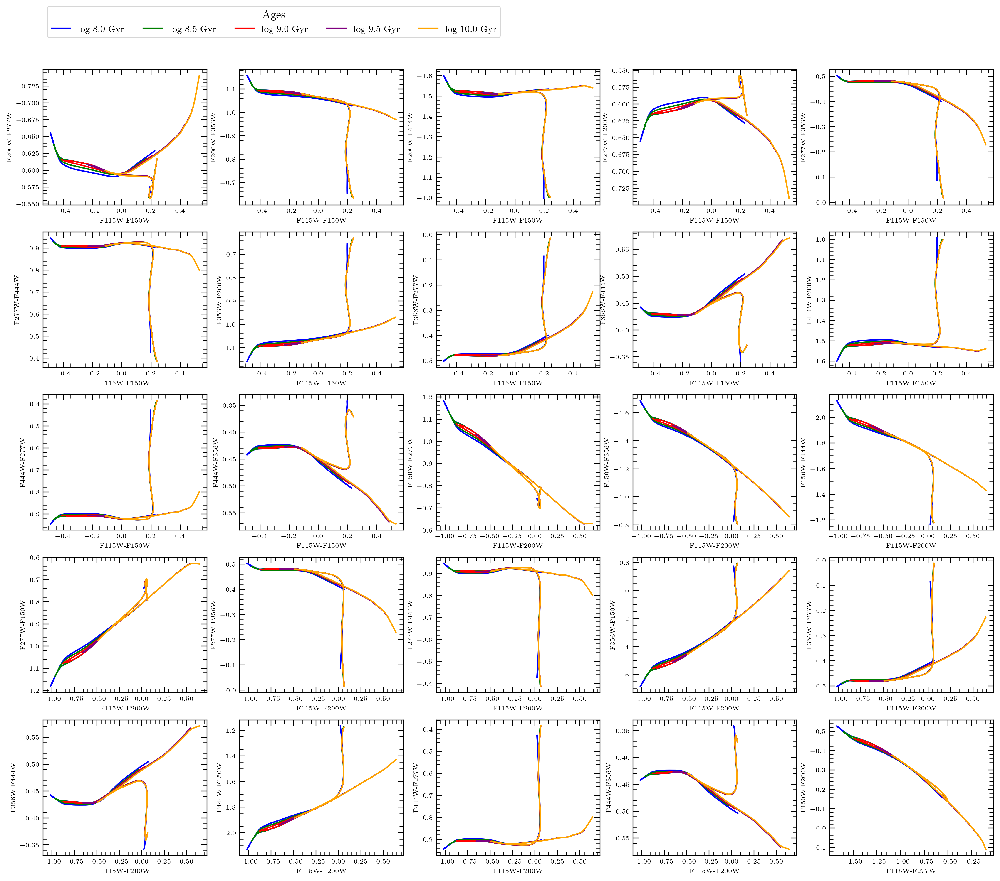

In [14]:
# color-color diagrams
n_rows, n_cols = 5, 5
fig, ax = plt.subplots(n_rows, n_cols, figsize=(18, 15), dpi=300)

panel = 0
for i in range(6):  # Loop over filter pairs for x-axis color index
    for j in range(6):
        if i != j:  # Exclude pairs where x == y for x-axis
            for k in range(6):
                if (
                    k != i and k != j
                ):  # Ensure y-axis filters are different from x-axis filters
                    for l in range(6):
                        if (
                            l != i and l != j and l != k
                        ):  # Ensure all filters in a pair are unique
                            # Check if panel index exceeds available subplots
                            if panel >= n_rows * n_cols:
                                break

                            # Define subplot position
                            row, col = divmod(panel, n_cols)
                            ax_panel = ax[row, col]

                            for c, age in enumerate(log_ages):
                                age_ind = isocmd.age_index(age)

                                # AB magnitudes for the chosen filters
                                F1_AB = isocmd.isocmds[age_ind][filtstr[i]] + vega2AB[i]
                                F2_AB = isocmd.isocmds[age_ind][filtstr[j]] + vega2AB[j]
                                F3_AB = isocmd.isocmds[age_ind][filtstr[k]] + vega2AB[k]
                                F4_AB = isocmd.isocmds[age_ind][filtstr[l]] + vega2AB[l]

                                # Select points where phase < 3
                                p = np.where(isocmd.isocmds[age_ind]["phase"] < 3)[0]

                                # Plot color-color diagram for this age
                                ax_panel.plot(
                                    F1_AB[p] - F2_AB[p],
                                    F3_AB[p] - F4_AB[p],
                                    color=colors[c],
                                    label=f"log {age} Gyr",
                                )

                            # Set labels and limits
                            ax_panel.set(
                                xlabel=filtstr[i] + "-" + filtstr[j],
                                ylabel=filtstr[k] + "-" + filtstr[l],
                                # xlim=(-1, 2),
                                # ylim=(-1, 2),
                            )
                            ax_panel.invert_yaxis()

                            # Add legend in the first panel only
                            if panel == 0:
                                ax_panel.legend(
                                    bbox_to_anchor=(0, 1.2),
                                    loc="lower left",
                                    ncol=5,
                                    fontsize=10,
                                    title="Ages",
                                    title_fontsize="12",
                                )

                            panel += 1
                            if panel >= n_rows * n_cols:
                                break  # Stop if the number of panels exceeds available space
                    if panel >= n_rows * n_cols:
                        break
            if panel >= n_rows * n_cols:
                break
        if panel >= n_rows * n_cols:
            break

plt.tight_layout()
plt.show()

## To do: Generate simple model galaxy and qso spectra using power laws and IGM absorption

Although galaxies contain a composite stellar population, typical spectra (parts of) can often be modeled
as a simple power law. The intrinsic spectrum may be attenuated or reddened by foreground dust, but this reddening may also simply change the slope of the power law.
QSOs or AGN also have power law spectra (with some strong emission lines, which galaxies may have as well).

As galaxies shift to high redshift, the intergalactic medium may also absorb part of a galaxy or QSO spectrum, shortward of Lyman alpha at 1216 Angstrom.  Synphot includes a module that incorporates IGM absorption based on Madau et al (1995). See:  https://synphot.readthedocs.io/en/latest/api/synphot.reddening.etau_madau.html#synphot.reddening.etau_madau

Use the code below to create a grid of galaxy models for three spectral slopes in Flambda (-3, -2 (which is flat in Fnu) and -1), and at redshifts 2,4,6,8,10,12,14,16


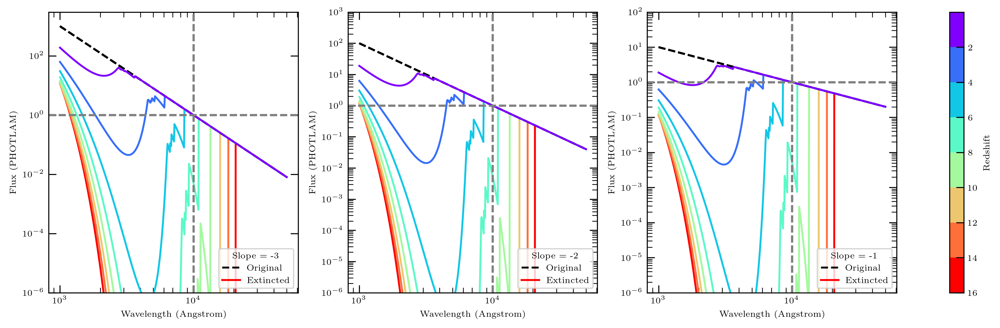

In [77]:
import matplotlib.pyplot as plt

from astropy import units as u
from synphot import SourceSpectrum
from synphot.models import PowerLawFlux1D
from synphot import SourceSpectrum, etau_madau
import matplotlib.colors as mcolors

slopes = [3, 2, 1]
redshifts = [16, 14, 12, 10, 8, 6, 4, 2]
# Define boundaries for the color segments
boundaries = np.arange(len(redshifts) + 1)
cmap = plt.get_cmap("rainbow_r", len(redshifts))
norm = mcolors.BoundaryNorm(boundaries, cmap.N)  # Normalize the segments

fig, ax = plt.subplots(1, 3, figsize=(15, 4), dpi=300)  # 3 columns
for i, s in enumerate(slopes):

    for j, z in enumerate(redshifts):

        sp = SourceSpectrum(PowerLawFlux1D, amplitude=1, x_0=1 * u.micron, alpha=s)
        wave = range(1000, 50000, 50) * u.AA
        extcurve = etau_madau(wave, z)
        sp_ext = sp * extcurve

        ax[i].plot(wave, sp(wave), "k--")
        ax[i].plot(wave, sp_ext(wave), color=cmap(norm(j)))
        ax[i].set_xlabel("Wavelength (Angstrom)")
        ax[i].set_ylabel("Flux (PHOTLAM)")
        ax[i].legend(
            ["Original", "Extincted"], loc="lower right", title="Slope = -" + str(s)
        )
        ax[i].set_xscale("log")
        ax[i].set_yscale("log")

        ax[i].plot(wavelengths=wave, xlog=True, ylog=True, bottom=0.1, top=1000)
        ax[i].axvline(sp.model.x_0.value, color="grey", ls="--")  # Ref wave
        ax[i].axhline(sp.model.amplitude.value, color="grey", ls="--")  # Ref flux

ax[0].set(ylim=(1e-6, 3e3))
ax[1].set(ylim=(1e-6, 1e3))
ax[2].set(ylim=(1e-6, 100))
# Create a segmented color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, ticks=boundaries[:-1])  # set ticks to the boundaries
cbar.set_ticklabels(redshifts)
cbar.set_label("Redshift")
plt.show()

## To do:
Observing these spectra through the NIRCAM bandpasses and show where galaxies with different spectral slopes and redshifts would be found on a a diagnostic color-color plot. A suggestion is to use F115W-F150W vs. F150W-F444W, but you can try some other combinations.

**Question**: Where should we expect to find high redshift galaxies, at z=8 or higher, in this or other, diagnostic color-color plots?
> In the plot below, we would expect high-z (z>8) objects near the red points. This is when the flux is so low that the magnitude is quite high. So in the same axes setup, we would expect them to be in the upper right roughly, since their magnitudes in the shorter wavelength tend to be larger and larger (dimmer in these bands), while the magnitude in the longer wavelength bands gets smaller (it is brighter there). 

**Question**: If our limiting NIRCAM magnitude is around 28 AB (in some band), what is our limiting ***absolute magnitude*** at the various redshifts? The code below calculates the cosmological luminosity distance and the distance modulus.  How does this compare with the Milky Way magnitude, which is approximately -21 AB?
> So fthe NIRCAM filter has a limiting absolute magnitude M ranging around -18 to -23. See the calculations below. This is around the same absolute magnitude as the MW. So the objects detected by NIRCAM have comparable brightnesses to the MW, but just very far away.  

In [78]:
from astropy.cosmology import WMAP9 as cosmo

redshifts = np.array([16, 14, 12, 10, 8, 6, 4, 2])  # redshifts
lumdist_mpc = cosmo.luminosity_distance(redshifts).value  # effective distances in Mpc
DM = 5.0 * np.log10(lumdist_mpc) + 25  # + 25 come from distnace modulus
print("Distance Modulus for selected redshifts:", DM)

# m−M=5log (d_L /10pc)
limiting_m = 28
M = limiting_m - 5 * np.log10((lumdist_mpc * u.Mpc).to(u.pc).value / 10)
print("z: ", redshifts)
print("Limiting Absolute Mags: ", M)

Distance Modulus for selected redshifts: [51.28640346 50.96246488 50.58620191 50.13785684 49.58399838 48.86117452
 47.82464483 46.00359481]
z:  [16 14 12 10  8  6  4  2]
Limiting Absolute Mags:  [-23.28640346 -22.96246488 -22.58620191 -22.13785684 -21.58399838
 -20.86117452 -19.82464483 -18.00359481]


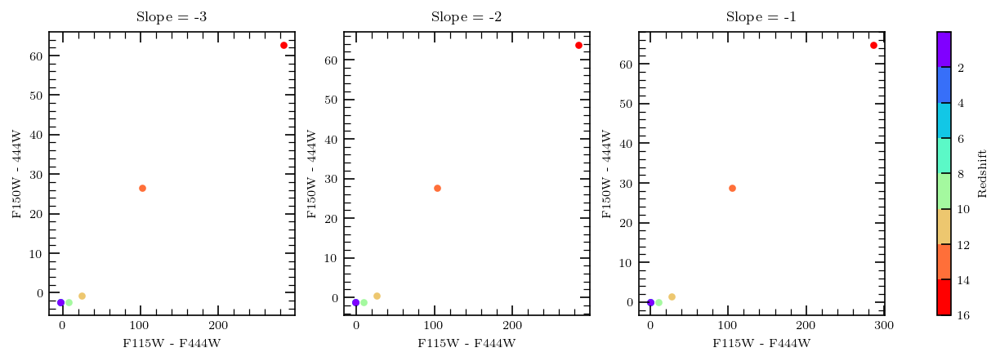

In [80]:
def get_mag(filter_name, redshift, n, DM):
    filt = filter_data[filter_name]
    # this is the galaxy spectrym
    sp = SourceSpectrum(PowerLawFlux1D, amplitude=1, x_0=1 * u.micron, alpha=n)
    extcurve = etau_madau(filt["Wavelength"], redshift)
    # final attenuated spectrum
    sp_ext = sp * extcurve
    # bandpass for a given filted
    bp = SpectralElement(
        Empirical1D,
        points=filt["Wavelength"],
        lookup_table=filt["Transmission"],
        keep_neg=True,
    )
    # set up the obsevation
    obs = Observation(sp_ext, bp, force="extrap", binset=filt["Wavelength"])
    # print("z=", redshift, obs.effstim(u.ABmag).value)
    return obs.effstim(u.ABmag).value + DM


fig, ax = plt.subplots(1, 3, figsize=(11, 3), dpi=150)
ax = ax.ravel()
for i, s in enumerate(slopes):
    # x = []
    # y = []
    for j, z in enumerate(redshifts):

        filter1 = filter_data["F115W"]
        filter2 = filter_data["F444W"]
        filter3 = filter_data["F150W"]

        mag_115W = get_mag("F115W", z, s, DM[j])
        mag_444W = get_mag("F444W", z, s, DM[j])
        mag_150W = get_mag("F150W", z, s, DM[j])

        x = mag_115W - mag_444W
        y = mag_150W - mag_444W

        ax[i].scatter(x, y, s=10, c=cmap(norm(j)))
    ax[i].set(xlabel="F115W - F444W", ylabel="F150W - 444W", title="Slope = -" + str(s))

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, ticks=boundaries[:-1])  # set ticks to the boundaries
cbar.set_ticklabels(redshifts)
cbar.set_label("Redshift")
plt.show()

### here it is with some weird test combination

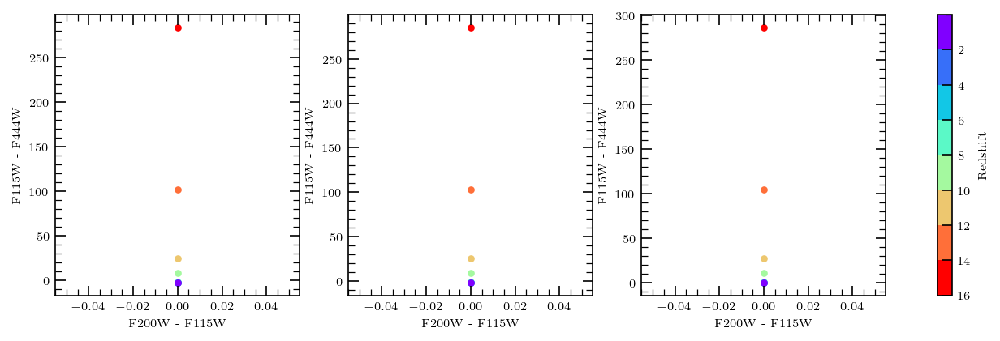

In [81]:
fig, ax = plt.subplots(1, 3, figsize=(11, 3), dpi=150)
ax = ax.ravel()
for i, s in enumerate(slopes):
    for j, z in enumerate(redshifts):
        # print(z)
        filter1 = filter_data["F200W"]
        filter2 = filter_data["F444W"]
        filter3 = filter_data["F115W"]

        mag_115W = get_mag("F200W", z, s, DM[j])
        mag_440W = get_mag("F444W", z, s, DM[j])
        mag_115W = get_mag("F115W", z, s, DM[j])

        x = mag_115W - mag_115W
        y = mag_115W - mag_440W

        ax[i].scatter(x, y, s=10, c=cmap(norm(j)))
    ax[i].set(xlabel="F200W - F115W", ylabel="F115W - F444W")
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, ticks=boundaries[:-1])  # set ticks to the boundaries
cbar.set_ticklabels(redshifts)
cbar.set_label("Redshift")
plt.show()

## Section 2: Analysis I - LMC NIR Stellar Photometry and Isochrone comparison

Include the cells from your Step 2 spreadsheet where you performed NIR stellar photometry in the LMC
* Extract aperture photometry from LMC field (panoramic-j043844m684)
* Generate color-magnitude and color-color diagrams (Include error bars on your plots)

Compare with simulated outputs for stars generated above 
* Use a distance modulus for the LMC (from literature)
* Overplot synthetic photometry for blackbody grid 
* Visually identify the best fit isochrone (age) and overplot isochrone curves
* You don't need to generate a catalog

Note: The Step2 notebook requires a zeropoint corrections, see next cell below for details


> plots used to answer these questions are below

**Question**: What would you estimate is the limiting magnitude of the Panoramic-JWST LMC field? (Base this on the faintest magnitudes you have detected, though we can estimate this more quantitatively)

> the faintest image detected in the scan through all the filters is around 30.

**Question**: What stellar phase and mass range are we probing at the depth of the Panoramic-JWST LMC field?

> Based on the F115W - F44W vs F115W CMD, we are probing 2000 to 4000 K stars across all radii range we took a look at. In terms of isochrones, the stars follow $10^{9.5 - 10} yr $ isochrones roughly, which is around 3 - 10 Gyr.

**Question**: Why might we not see stars at the upper end of the mass range or in more evolved phases?   
> Massive stars live fast, die young, at this rough age, the massive stars might have gone (CC)SNe already. I think > 8 Msun goes SNe $\lesssim$ 40 Myrs. In terms of more evolved phases, like WD, those have very low luminosities (they're quite small), so the magnitudes are even higher than the limitting magnitude. 

**Edits on Step2 notebook.**

The Panoramic-JWST survey uses a different zeropoint reference per pixel than the standard JWST pipeline (values are in 0.01 microJy flux units, rather than 1MJy/steradian surface brightnesses).

We need to modify the cell that calculates fluxes in microJy to the commented lines below

In [19]:
# flux_uJy = np.zeros((nbands,nobj))
# fluxerr_uJy = np.zeros((nbands,nobj))
# flux_ergscmA = np.zeros((nbands,nobj))
# fluxerr_ergscmA = np.zeros((nbands,nobj))

# arcsec2_per_sr = 4.25e+10
# sr_per_pix = (np.array(pixsize))**2/arcsec2_per_sr

# for bb in np.arange(0,nbands):
#    flux_uJy = flux*1e-2
#    fluxerr_uJy = fluxerr*1e-2

# flux_ergscmA = flux_uJy*1e-6*1.0e-23*2.998e+18/photo_wave/photo_wave
# fluxerr_ergscmA = fluxerr_uJy*1e-6*1.0e-23*2.998e+18/photo_wave/photo_wave

### step 2 notebook

717


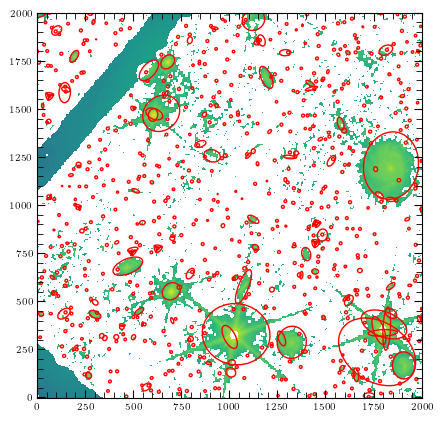

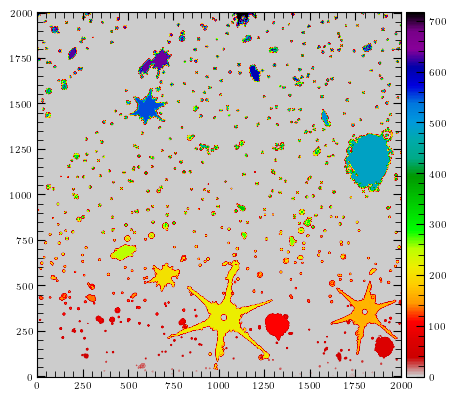

In [20]:
# list of filters and their names
filters = [
    "f115w",
    "jwst_nircam_f150w",
    "jwst_nircam_f200w",
    "jwst_nircam_f277w",
    "jwst_nircam_f356w",
    "jwst_nircam_f444w",
]

# number of filters
nbands = len(filters)

# Wavelength of the filters
photo_wave = [11540.0, 15010.0, 19890.0, 27620.0, 35680.0, 44080.0]

# # pixel scale of the images
pixsize = [0.02, 0.02, 0.02, 0.04, 0.04, 0.04]

# get data image for one fitler to see what it looks like
hdu = fits.open(
    "./lmc_data/psfmatch_crop1_panoramic-j043844m6849-v7.2-f115w-clear_drc_sci.fits.gz"
)
data_sci = hdu[0].data
hdu.close()
data_sci = data_sci.byteswap(inplace=True).newbyteorder()

# get weight image
hdu = fits.open(
    "./lmc_data/psfmatch_crop1_weight_panoramic-j043844m6849-v7.2-f115w-clear_drc_wht.fits.gz"
)
data_wht = hdu[0].data
hdu.close()
data_wht = data_wht.byteswap(inplace=True).newbyteorder()

data_err = np.sqrt(1.0 / data_wht)
objects, segmap = sep.extract(
    data_sci,
    thresh=2.0,
    err=data_err,
    minarea=5,
    deblend_nthresh=32,
    deblend_cont=0.005,
    segmentation_map=True,
)

# Get number of detected objects
nobj = len(objects)
print(nobj)

# plot background-subtracted image
fig, ax = plt.subplots(figsize=(5, 5))
im = ax.imshow(np.log10(data_sci), origin="lower")

# plot an ellipse for each object
for i in range(nobj):
    e = Ellipse(
        xy=(objects["x"][i], objects["y"][i]),
        width=6 * objects["a"][i],
        height=6 * objects["b"][i],
        angle=objects["theta"][i] * 180.0 / np.pi,
    )
    e.set_facecolor("none")
    e.set_edgecolor("red")
    ax.add_artist(e)


# show the segmentation map
fig = plt.figure(figsize=(5, 5))
f1 = plt.subplot()
im = plt.imshow(segmap, origin="lower", cmap="nipy_spectral_r")
divider = make_axes_locatable(f1)
cax = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax)

###  let's do the entire LMC field across all filters, not jusst from the one above

In [21]:
sci_img = [
    "./lmc_data/psfmatch_crop1_panoramic-j043844m6849-v7.2-f115w-clear_drc_sci.fits.gz",
    "./lmc_data/psfmatch_crop1_panoramic-j043844m6849-v7.2-f150w-clear_drc_sci.fits.gz",
    "./lmc_data/psfmatch_crop1_panoramic-j043844m6849-v7.2-f200w-clear_drc_sci.fits.gz",
    "./lmc_data/psfmatch_crop1_panoramic-j043844m6849-v7.2-f277w-clear_drc_sci.fits.gz",
    "./lmc_data/psfmatch_crop1_panoramic-j043844m6849-v7.2-f356w-clear_drc_sci.fits.gz",
    "./lmc_data/crop1_panoramic-j043844m6849-v7.2-f444w-clear_drc_sci.fits.gz",
]
wht_img = [
    "./lmc_data/psfmatch_crop1_weight_panoramic-j043844m6849-v7.2-f115w-clear_drc_wht.fits.gz",
    "./lmc_data/psfmatch_crop1_weight_panoramic-j043844m6849-v7.2-f150w-clear_drc_wht.fits.gz",
    "./lmc_data/psfmatch_crop1_weight_panoramic-j043844m6849-v7.2-f200w-clear_drc_wht.fits.gz",
    "./lmc_data/psfmatch_crop1_weight_panoramic-j043844m6849-v7.2-f277w-clear_drc_wht.fits.gz",
    "./lmc_data/psfmatch_crop1_weight_panoramic-j043844m6849-v7.2-f356w-clear_drc_wht.fits.gz",
    "./lmc_data/crop1_weight_panoramic-j043844m6849-v7.2-f444w-clear_drc_wht.fits.gz",
]

aper_radius_arcsec = 0.5  # use this size aperture
det_image_index = 1  # for f150w image

flux0 = np.zeros((nbands, nobj))
fluxerr0 = np.zeros((nbands, nobj))
flag0 = np.zeros((nbands, nobj))

# loop over the filters and calculate the fluxes
for bb in range(0, nbands):
    aper_radius = aper_radius_arcsec / (pixsize[bb])  # aperture radius in pixels
    obj_x = objects["x"] * pixsize[det_image_index] / pixsize[bb]
    obj_y = objects["y"] * pixsize[det_image_index] / pixsize[bb]
    # print(aper_radius)
    # science image
    hdu = fits.open(sci_img[bb])
    data_sci = hdu[0].data
    hdu.close()
    data_sci = data_sci.byteswap(inplace=True).newbyteorder()

    # weights
    print(wht_img[bb])
    hdu = fits.open(wht_img[bb])
    data_wht = hdu[0].data
    hdu.close()
    data_wht = data_wht.byteswap(inplace=True).newbyteorder()

    # error
    data_err = np.sqrt(1.0 / data_wht)

    flux0[bb], fluxerr0[bb], flag0[bb] = sep.sum_circle(
        data_sci, obj_x, obj_y, aper_radius, err=data_err, gain=1.0
    )

    # change nan or inf
    idx_ch = np.where(np.isnan(flux0[bb]) == True)
    flux0[bb][idx_ch[0]] = -99.0

    idx_ch = np.where(np.isnan(fluxerr0[bb]) == True)
    fluxerr0[bb][idx_ch[0]] = -99.0

./lmc_data/psfmatch_crop1_weight_panoramic-j043844m6849-v7.2-f115w-clear_drc_wht.fits.gz
./lmc_data/psfmatch_crop1_weight_panoramic-j043844m6849-v7.2-f150w-clear_drc_wht.fits.gz
./lmc_data/psfmatch_crop1_weight_panoramic-j043844m6849-v7.2-f200w-clear_drc_wht.fits.gz
./lmc_data/psfmatch_crop1_weight_panoramic-j043844m6849-v7.2-f277w-clear_drc_wht.fits.gz
./lmc_data/psfmatch_crop1_weight_panoramic-j043844m6849-v7.2-f356w-clear_drc_wht.fits.gz
./lmc_data/crop1_weight_panoramic-j043844m6849-v7.2-f444w-clear_drc_wht.fits.gz


In [22]:
# transpose from (band-id, obj-id) to (obj-id, band-id)
flux = np.transpose(flux0, axes=(1, 0))
fluxerr = np.transpose(fluxerr0, axes=(1, 0))
flag = np.transpose(flag0, axes=(1, 0))

In [23]:
# make a table of the calculated fluxes
fname = ["f115w", "f150w", "f200w", "f277w", "f356w", "f444w"]
idx = np.arange(nobj)
data_table = []
names = []
data_table.append(idx)
names.append("ID")
data_table.append(objects["x"])
names.append("x")
data_table.append(objects["y"])
names.append("y")
for bb in range(0, nbands):
    data_table.append(flux0[bb])
    names.append("f_%s" % fname[bb])
    data_table.append(fluxerr0[bb])
    names.append("fe_%s" % fname[bb])

names = tuple(names)

t = QTable(data_table, names=names, meta={"name": "catalog"})
print(names)

('ID', 'x', 'y', 'f_f115w', 'fe_f115w', 'f_f150w', 'fe_f150w', 'f_f200w', 'fe_f200w', 'f_f277w', 'fe_f277w', 'f_f356w', 'fe_f356w', 'f_f444w', 'fe_f444w')


In [24]:
t

ID,x,y,f_f115w,fe_f115w,f_f150w,fe_f150w,f_f200w,fe_f200w,f_f277w,fe_f277w,f_f356w,fe_f356w,f_f444w,fe_f444w
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
0,464.50450740390494,4.935089811403558,69.85702202968857,8.442006204230204,67.14200549319482,8.24754875090691,50.833883914172304,7.171201738843248,24.62362932231016,4.988279789807317,16.210608946926072,4.054540513150355,11.255701596587313,3.4274668200287524
1,1253.2633697357066,8.850332148650685,-4.921144949169103,1.268307563589147,2.3690230617591834,1.8365237778718062,1.5286418284652603,1.4750442688786616,1.8639462756538714,1.4806025094761504,1.0549176450262898,1.1765429680815986,1.0349821026905555,-99.0
2,1416.43982144943,7.116759347123789,45.93174124738218,6.889318827576435,52.03337298622871,7.279362687344099,40.11754256800437,6.38411697212285,27.442728058277424,5.264958309001036,18.3090050634602,4.308901843948561,10.825212819170792,3.375660195129349
3,1623.3976663845908,9.55725617782392,0.5437470426068384,1.471095581074842,1.5172616210599346,1.596341957707531,-2.108700450597025,0.8145825585896135,5.202518563508529,2.3452263324282625,3.0103428843231814,1.8133109044803615,1.1598499442289811,1.351787056477992
4,1724.878377950053,3.1756504507353056,420.02131289750497,20.52678204736827,323.1120153026217,17.99787112994361,223.85478230856572,14.979701951647563,93.0209247542638,9.657016611063554,64.91719759475585,8.071423717957002,51.61369634995701,7.2212304145455946
5,1725.400836290227,9.102419903456886,424.6999088921491,20.647833353025646,328.25834465697557,18.145378431853008,228.38283691012822,15.134243378924968,100.80422904745677,10.054994855712819,68.86981451414671,8.316242228215433,53.48371337537656,7.361591315860142
6,739.9150669107552,17.224195858463045,36.81840481598781,6.228144199383819,41.664256007608955,6.549615849779686,34.89430794228905,5.976491250658274,23.092023176543293,4.841756220927085,13.961234127405042,3.7784462866753192,10.33672714014314,3.323759153334302
7,1443.0641746690364,16.64336935929679,41.3831117430291,6.583675641648659,44.1839136363445,6.7365442830042275,39.48112430212443,6.348555003267865,24.914252021109412,5.026988570897342,20.09068709362299,4.518734544395918,11.42111953724141,3.491515074391707
8,1788.5230196625894,20.515388983719475,1.9612826222672344,2.0062534159868006,5.393602942104174,2.583669769282553,9.06122685432127,3.1507654124857325,5.117875715859046,2.360732991900547,3.3804528250609387,1.9502021995939742,0.6429371287296816,inf


In [25]:
# corrected 0 point fluxes in each filters

flux_uJy = np.zeros((nbands, nobj))
fluxerr_uJy = np.zeros((nbands, nobj))

flux_ergscmA = np.zeros((nbands, nobj))
fluxerr_ergscmA = np.zeros((nbands, nobj))

arcsec2_per_sr = 4.25e10
sr_per_pix = (np.array(pixsize)) ** 2 / arcsec2_per_sr

for bb in np.arange(0, nbands):
    print(fname[bb])
    flux_uJy = flux * 1e-2
    fluxerr_uJy = fluxerr * 1e-2

flux_ergscmA = flux_uJy * 1e-6 * 1.0e-23 * 2.998e18 / photo_wave / photo_wave
fluxerr_ergscmA = fluxerr_uJy * 1e-6 * 1.0e-23 * 2.998e18 / photo_wave / photo_wave

flux_ergscmA.shape

f115w
f150w
f200w
f277w
f356w
f444w


(717, 6)

LMC distance modulus 18.494850021680094
F115W F444W


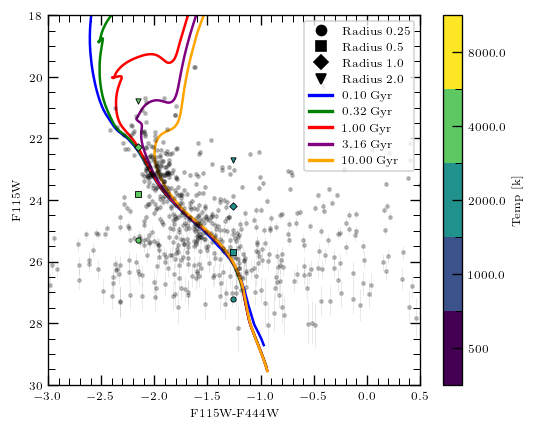

In [26]:
import matplotlib.lines as mlines

log_ages = [8.0, 8.5, 9.0, 9.5, 10.0]
colors = ["blue", "green", "red", "purple", "orange"]
distance_lmc = 50e3  # distance to LMC in pc
dist_modulus = 5 * np.log10(distance_lmc) - 5
print("LMC distance modulus", dist_modulus)

# the columns are f115w, f150w, f200w, f277w, f356w, f444w
mag_AB = 8.9 - 2.5 * np.log10(flux_uJy * 1e-6)
# AB magnitude uncertainty
mag_AB_err = 2.5 * np.log10(1 + fluxerr / flux)
# mag_AB_err = np.nan_to_num(mag_AB_err, nan=0)
mag_AB_err[np.isnan(mag_AB_err)] = 0  # replace nan with 0
# print(mag_AB_err.shape)


def get_synthetic_grid(filter, radius):
    mags = []
    for t in temperatures:
        mags.append(mag_grids[(filter, radius, t)])
    return np.array(mags)


# let's just do a one filter combination
f1 = 0
f2 = 5
fig, ax = plt.subplots(1, 1, figsize=(5, 4), dpi=120)
ax.errorbar(
    mag_AB[:, f1] - mag_AB[:, f2],
    mag_AB[:, f1],
    yerr=np.abs(mag_AB_err[:, f1]),
    fmt="o",
    markersize=2,
    alpha=0.2,
    c="black",
    ecolor="grey",
    elinewidth=0.5,
)
ax.set(xlabel=filtstr[f1] + "-" + filtstr[f2], ylabel=filtstr[f1])

print(filtstr[f1], filtstr[f2])
# Define boundaries for the color segments
boundaries = np.arange(len(temperatures) + 1) + 0.5
cmap = plt.get_cmap("viridis", len(temperatures))
norm = mcolors.BoundaryNorm(boundaries, cmap.N)  # Normalize the segments
markers = ["o", "s", "D", "v", "^"]
for ridx, r in enumerate(radii):
    synth_f1 = get_synthetic_grid(filtstr[f1], r)
    synth_f2 = get_synthetic_grid(filtstr[f2], r)
    for i, t in enumerate(temperatures):
        # print(t)
        ax.scatter(
            synth_f1[i] - synth_f2[i],
            synth_f1[i],
            c=cmap(norm(i)),
            s=10,
            marker=markers[ridx],
            linewidths=0.5,
            edgecolors="black",
            zorder=10,
        )

for i, a in enumerate(log_ages):
    age_ind = isocmd.age_index(a)
    # vega isochrone with correction to AB magnitudes in JWST filters
    F1_AB = isocmd.isocmds[age_ind][filtstr[f1]] + vega2AB[f1]
    F2_AB = isocmd.isocmds[age_ind][filtstr[f2]] + vega2AB[f2]
    # restrict to main sequence stars
    p = np.where(isocmd.isocmds[age_ind]["phase"] < 3)[0]
    # plot the isochrone
    ax.plot(
        F1_AB[p] - F2_AB[p],
        F1_AB[p] + dist_modulus,  # distnace modulus is 18.494850021680094
        label=f"log {a} Gyr",
        color=colors[i],
    )
ax.set(
    xlabel=filtstr[f1] + "-" + filtstr[f2],
    ylabel=filtstr[f1],
    ylim=(30, 18),
    xlim=(-3, 0.5),
)

# Create a segmented color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
midpoints = (boundaries[:-1] + boundaries[1:]) / 2
cbar = plt.colorbar(sm, ax=ax, ticks=midpoints)  # set ticks to the boundaries
cbar.set_ticklabels(temperatures)
cbar.set_label("Temp [k]")

# custom legend for markers
legend_handles = [
    mlines.Line2D(
        [],
        [],
        color="black",
        marker=markers[i],
        linestyle="None",
        markersize=6,
        label=f"Radius {r}",
    )
    for i, r in enumerate(radii)
]
# custom legend for isochrones
isochrone_handles = [
    mlines.Line2D(
        [],
        [],
        color=color,
        marker="None",
        linestyle="-",
        linewidth=2,
        label=r" {:.2f} Gyr".format(10**a / 1e9),
    )
    for a, color in zip(log_ages, colors)
]

# Combine both legends
ax.legend(handles=legend_handles + isochrone_handles, loc="upper right")

plt.show()

### here we can do a quick scan of all the pairings

note some of them might not make much sense to pair up-- just an exhaustive list 

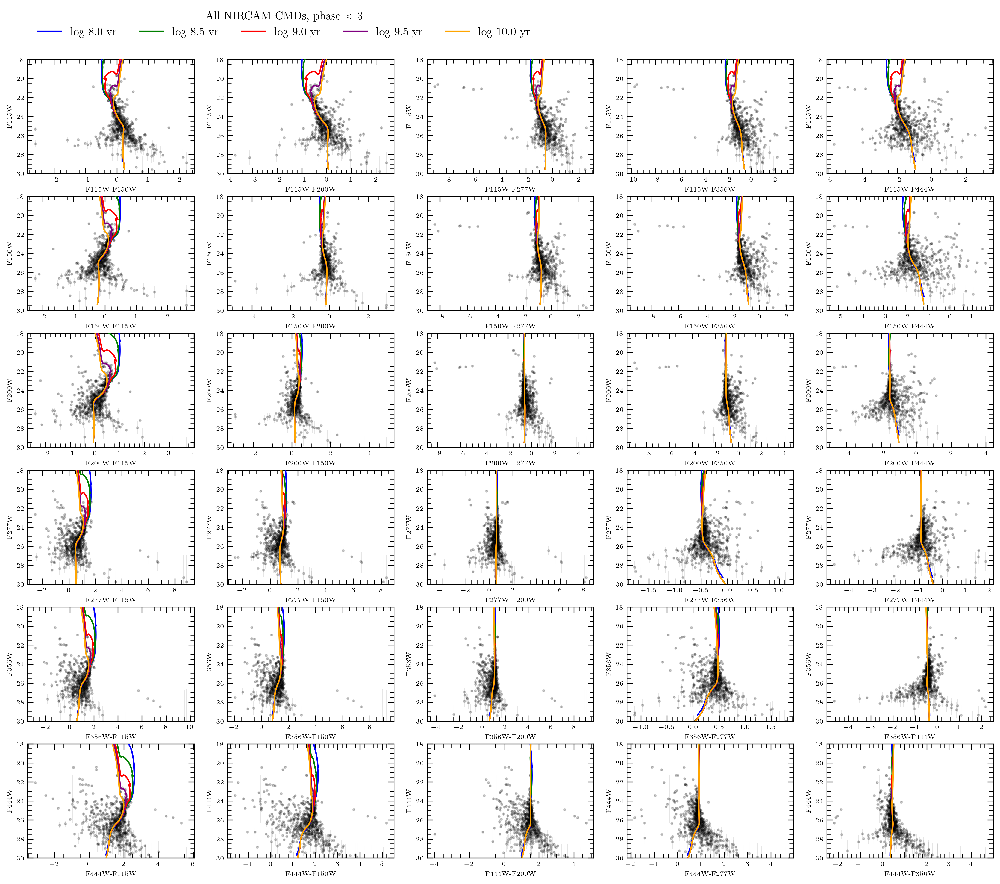

In [29]:
fig, ax = plt.subplots(6, 5, figsize=(18, 15), dpi=300)
row = 0

for i in range(6):  # 6 filters
    col = 0
    for j in range(6):
        if i != j:  # Exclude pairs where x == y
            f1 = i  # x-axis filter
            f2 = j  # y-axis filter
            # plot the color-magnitude diagram data from the LMC
            ax[row, col].errorbar(
                mag_AB[:, f1] - mag_AB[:, f2],
                mag_AB[:, f1],
                yerr=np.abs(mag_AB_err[:, f1]),
                fmt="o",
                markersize=2,
                alpha=0.2,
                c="black",
                ecolor="grey",
                elinewidth=0.5,
            )
            # print(fname[f1])
            # print(filtstr[f1])
            # plot the isochrones for the selected filters  and age
            for c, age in enumerate(log_ages):
                # returns the index for the desired age
                age_ind = isocmd.age_index(age)
                F1_AB = isocmd.isocmds[age_ind][filtstr[f1]] + vega2AB[f1]
                F2_AB = isocmd.isocmds[age_ind][filtstr[f2]] + vega2AB[f2]
                p = np.where(isocmd.isocmds[age_ind]["phase"] < 3)[0]

                ax[row, col].plot(
                    F1_AB[p] - F2_AB[p],
                    F1_AB[p] + dist_modulus,
                    color=colors[c],
                    label=f"log {age} yr",
                    zorder=4,
                )
            ax[row, col].set(
                xlabel=filtstr[f1] + "-" + filtstr[f2],
                ylabel=filtstr[f1],
                ylim=(30, 18),
                # xlim=(-3, 1),
            )
            col = col + 1
    row = row + 1

ax[0, 0].legend(
    bbox_to_anchor=(0, 1.1),
    loc="lower left",
    ncols=5,
    fontsize=12,
    title=r"All NIRCAM CMDs, phase $<$ 3",
    title_fontsize="12",
    frameon=False,
)
plt.show()

### here is a scan through of color-color diagrams, with some test axes pairings

we do this for real in part 3

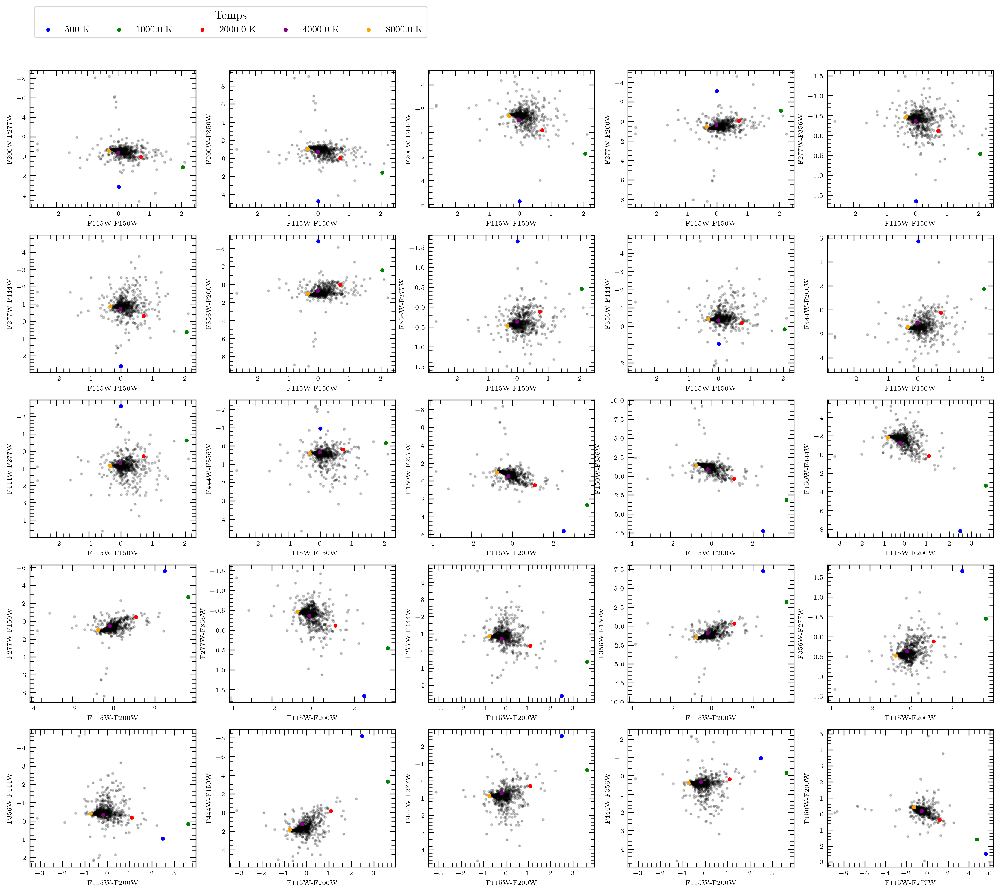

In [30]:
# color-color diagrams
def get_colors(filter_j, filter_i, filter_k, filter_l, radii_list, temperature_list):
    synthetic_j = []
    synthetic_i = []
    synthetic_k = []
    synthetic_l = []
    # this is so ugly, god help me
    for r in radii:
        if r in radii_list:
            for t in temperatures:
                if t in temperature_list:
                    synthetic_j.append(mag_grids[(filter_j, r, t)])
                    synthetic_i.append(mag_grids[(filter_i, r, t)])
                    synthetic_k.append(mag_grids[(filter_k, r, t)])
                    synthetic_l.append(mag_grids[(filter_l, r, t)])
    return (
        np.array(synthetic_j),
        np.array(synthetic_i),
        np.array(synthetic_k),
        np.array(synthetic_l),
    )


n_rows, n_cols = 5, 5
fig, ax = plt.subplots(n_rows, n_cols, figsize=(18, 15), dpi=300)

panel = 0
for i in range(6):  # Loop over filter pairs for x-axis color index
    for j in range(6):
        if i != j:  # Exclude pairs where x == y for x-axis
            for k in range(6):
                if (
                    k != i and k != j
                ):  # Ensure y-axis filters are different from x-axis filters
                    for l in range(6):
                        if l != i and l != j and l != k:
                            # Ensure all filters in a pair are unique
                            # Check if panel index exceeds available subplots
                            if panel >= n_rows * n_cols:
                                break

                            # Define subplot position
                            row, col = divmod(panel, n_cols)
                            ax_panel = ax[row, col]

                            ax[row, col].errorbar(
                                mag_AB[:, i] - mag_AB[:, j],
                                mag_AB[:, k] - mag_AB[:, l],
                                fmt="o",
                                markersize=2,
                                alpha=0.2,
                                c="black",
                                ecolor="grey",
                                elinewidth=0.5,
                            )
                            temp_colors = ["blue", "green", "red", "purple", "orange"]
                            for tidx, t in enumerate(temperatures):
                                synthetic_j, synthetic_i, synthetic_k, synthetic_l = (
                                    get_colors(
                                        filtstr[j],
                                        filtstr[i],
                                        filtstr[k],
                                        filtstr[l],
                                        [1],  # solar radii
                                        temperature_list=[t],
                                    )
                                )
                                # Plot color-color diagram
                                ax[row, col].scatter(
                                    np.array(synthetic_i) - np.array(synthetic_j),
                                    np.array(synthetic_k) - np.array(synthetic_l),
                                    s=10,
                                    c=temp_colors[tidx],
                                    label=f"{t} K",
                                    zorder=4,
                                )

                            # Set labels and limits
                            ax_panel.set(
                                xlabel=filtstr[i] + "-" + filtstr[j],
                                ylabel=filtstr[k] + "-" + filtstr[l],
                                # xlim=(-1, 2),
                                # ylim=(-1, 2),
                            )
                            ax_panel.invert_yaxis()

                            # Add legend in the first panel only
                            if panel == 0:
                                ax_panel.legend(
                                    bbox_to_anchor=(0, 1.2),
                                    loc="lower left",
                                    ncol=5,
                                    fontsize=10,
                                    title="Temps",
                                    title_fontsize="12",
                                )

                            panel += 1
                            if panel >= n_rows * n_cols:
                                break  # Stop if the number of panels exceeds available space
                    if panel >= n_rows * n_cols:
                        break
            if panel >= n_rows * n_cols:
                break
        if panel >= n_rows * n_cols:
            break


plt.show()

## Section 3: Analysis II - Blank sky field galaxy properties

Include the cells from your Step 2 spreadsheet where you performed NIR photometry on a blank sky field in the SSA region
* We will assume that most of the detected sources are galaxies
* Generate color-color plots (with error bars). Start with one or more of the color-color plots you made for the galaxy simulation above

Compare with simulated galaxies with different spectral slopes and at different redshifts

Note: The Step2 notebook requires the same zeropoint correction as above

> the plots used to answer these questions are below

**Question**: Do your galaxy simulated photometry models cover the same region of color-color space as the JWST observed galaxies?

> yes, there are some overlap in the color-color plots below, especially for the high-z synthetic galaxies. the different spectral slopes are present; though, it is notable that the $-1$ slope (see legend in the top left panel) has the most overlap, but for low-z (z=2).

**Question**: Might any of the galaxies in the observed data set be at high redshift, z>=6?  Why or why not?
> possibly. I have chosen a relatively empty field, where there aren't as many foreground galaxies. There are seemingly red points in the image as well (see below). techincally speaking, the panoramic survey is design to look at UV-bright object between $z\sim 12$  and $z=10$ optical emission according to their website. to really make sure, however, we will have to determine the photometric redshift via somthing like EAZY.

**Question**: Estimate the limiting magnitude for Panoramic-JWST SSA field we have chosen.  To detect a galaxy
    at z~6, how bright must it be compared to the Milky Way?
>  The absolute magnitude of the limiting magnitude (~37 is the higher magnitude calculated, we can view this as the limitting magnitude) is around -11 at z=6. The MW, as discussed earlier has an absolute magnitude of -21. Obviously, the milky way is brighter (more negative). The MW is around 6e3 times brighter than the limiting magnitude of the field at z=6. So the object can be as little as 0.0001 times as bright and still get detected.


In [147]:
lumdist_mpc_z6 = cosmo.luminosity_distance(6).value  # effective distances in Mpc
DM = 5.0 * np.log10(lumdist_mpc_z6) + 25  # + 25 come from distance modulus
print("Distance Modulus for z=6", DM)

# m−M=5log (d_L /10pc)
limiting_m = 37.4 # for our field this is the highest mag, so we can attribute it as the see below the 
M = limiting_m - 5 * np.log10((lumdist_mpc_z6 * u.Mpc).to(u.pc).value / 10)

milky_way_AB = -21.0  # absolute magnitude of the milky way
print("limiting magnitude from the data (see below)", limiting_m)
print("absolute magnitude of the milky way", milky_way_AB)
print("absolute magnitude of the limiting magnitude", M, "at z=6")

brigthness_ratio = 10 ** ((M - milky_way_AB) / 2.5) 

print("MW is ", brigthness_ratio, "times brighter than the limiting magnitude")
1/brigthness_ratio

Distance Modulus for z=6 48.86117452074893
limiting magnitude from the data (see below) 37.4
absolute magnitude of the milky way -21.0
absolute magnitude of the limiting magnitude -11.461174520748934 at z=6
MW is  6539.283888456696 times brighter than the limiting magnitude


0.00015292194329798474

### Here we will take look at a cropped region in the SSA j221700p0025 v7.2 field

I have chosen a relatively empty region to crop, after PSF matching, this is what it looks like. There are not many nearby galaxies like we had for step 1, the initial field we cropped.

<img src="./rgb_crop2.png" alt="Cropped Region" width="500"/>

### we follow the general procedure
- we read in the science frames and extract the sources
- measure the fluxes, generate color-color maps
- compare with the magnitude of the model galaxies across redshift an extinction slopes.

264


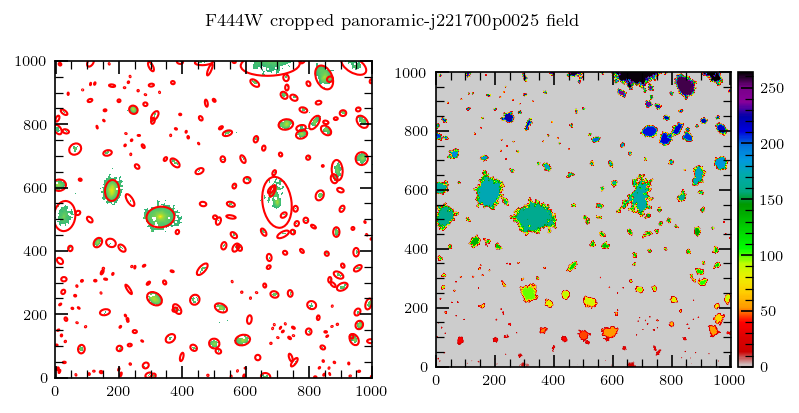

In [44]:
# # pixel scale of the images
pixsize = [0.02, 0.02, 0.02, 0.04, 0.04, 0.04]

# get data image for one fitler to see what it looks like
hdu = fits.open(
    "./ssa_field_lab2/crop1_sci_panoramic-j221700p0025-v7.2-f444w-clear_drc_sci.fits.gz"
)
data_sci = hdu[0].data
hdu.close()
data_sci = data_sci.byteswap(inplace=True).newbyteorder()

# get weight image
hdu = fits.open(
    "./ssa_field_lab2/crop1_weight_panoramic-j221700p0025-v7.2-f444w-clear_drc_wht.fits.gz"
)
data_wht = hdu[0].data
hdu.close()
data_wht = data_wht.byteswap(inplace=True).newbyteorder()

data_err = np.sqrt(1.0 / data_wht)
objects, segmap = sep.extract(
    data_sci,
    thresh=2.0,
    err=data_err,
    minarea=5,
    deblend_nthresh=32,
    deblend_cont=0.005,
    segmentation_map=True,
)

# Get number of detected objects
nobj = len(objects)
print(nobj)

# plot background-subtracted image
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(6, 3), dpi=150)
im = ax[0].imshow(np.log10(data_sci), origin="lower")

# plot an ellipse for each object
for i in range(nobj):
    e = Ellipse(
        xy=(objects["x"][i], objects["y"][i]),
        width=6 * objects["a"][i],
        height=6 * objects["b"][i],
        angle=objects["theta"][i] * 180.0 / np.pi,
    )
    e.set_facecolor("none")
    e.set_edgecolor("red")
    ax[0].add_artist(e)


# show the segmentation map
im = ax[1].imshow(segmap, origin="lower", cmap="nipy_spectral_r")
divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax)
plt.suptitle("F444W cropped panoramic-j221700p0025 field", y=0.95)
plt.show()

Ok, so above we see the sources extracted from this given bandpass, we do it for the entire filter list below.

In [49]:
sci_img = [
    "./ssa_field_lab2/psfmatch_crop1_sci_panoramic-j221700p0025-v7.2-f115w-clear_drc_sci.fits.gz",
    "./ssa_field_lab2/psfmatch_crop1_sci_panoramic-j221700p0025-v7.2-f150w-clear_drc_sci.fits.gz",
    "./ssa_field_lab2/psfmatch_crop1_sci_panoramic-j221700p0025-v7.2-f200w-clear_drc_sci.fits.gz",
    "./ssa_field_lab2/psfmatch_crop1_sci_panoramic-j221700p0025-v7.2-f277w-clear_drc_sci.fits.gz",
    "./ssa_field_lab2/psfmatch_crop1_sci_panoramic-j221700p0025-v7.2-f356w-clear_drc_sci.fits.gz",
    "./ssa_field_lab2/crop1_sci_panoramic-j221700p0025-v7.2-f444w-clear_drc_sci.fits.gz",
]
wht_img = [
    "./ssa_field_lab2/psfmatch_crop1_weight_panoramic-j221700p0025-v7.2-f115w-clear_drc_wht.fits.gz",
    "./ssa_field_lab2/psfmatch_crop1_weight_panoramic-j221700p0025-v7.2-f150w-clear_drc_wht.fits.gz",
    "./ssa_field_lab2/psfmatch_crop1_weight_panoramic-j221700p0025-v7.2-f200w-clear_drc_wht.fits.gz",
    "./ssa_field_lab2/psfmatch_crop1_weight_panoramic-j221700p0025-v7.2-f277w-clear_drc_wht.fits.gz",
    "./ssa_field_lab2/psfmatch_crop1_weight_panoramic-j221700p0025-v7.2-f356w-clear_drc_wht.fits.gz",
    "./ssa_field_lab2/crop1_weight_panoramic-j221700p0025-v7.2-f444w-clear_drc_wht.fits.gz",
]

aper_radius_arcsec = 0.5  # use this size aperture
det_image_index = 1  # for f150w image
flux0 = np.zeros((nbands, nobj))
fluxerr0 = np.zeros((nbands, nobj))
flag0 = np.zeros((nbands, nobj))

# loop over the filters and calculate the fluxes
for bb in range(0, nbands):
    aper_radius = aper_radius_arcsec / (pixsize[bb])  # aperture radius in pixels
    obj_x = objects["x"] * pixsize[det_image_index] / pixsize[bb]
    obj_y = objects["y"] * pixsize[det_image_index] / pixsize[bb]
    # print(aper_radius)
    # science image
    hdu = fits.open(sci_img[bb])
    data_sci = hdu[0].data
    hdu.close()
    data_sci = data_sci.byteswap(inplace=True).newbyteorder()

    # weights
    print(wht_img[bb])
    hdu = fits.open(wht_img[bb])
    data_wht = hdu[0].data
    hdu.close()
    data_wht = data_wht.byteswap(inplace=True).newbyteorder()
    # error
    data_err = np.sqrt(1.0 / data_wht)
    flux0[bb], fluxerr0[bb], flag0[bb] = sep.sum_circle(
        data_sci, obj_x, obj_y, aper_radius, err=data_err, gain=1.0
    )
    # change nan or inf
    idx_ch = np.where(np.isnan(flux0[bb]) == True)
    flux0[bb][idx_ch[0]] = -99.0

    idx_ch = np.where(np.isnan(fluxerr0[bb]) == True)
    fluxerr0[bb][idx_ch[0]] = -99.0

# transpose from (band-id, obj-id) to (obj-id, band-id)
flux = np.transpose(flux0, axes=(1, 0))
fluxerr = np.transpose(fluxerr0, axes=(1, 0))
flag = np.transpose(flag0, axes=(1, 0))

# make a table of the calculated fluxes
fname = ["f115w", "f150w", "f200w", "f277w", "f356w", "f444w"]
idx = np.arange(nobj)
data_table = []
names = []
data_table.append(idx)
names.append("ID")
data_table.append(objects["x"])
names.append("x")
data_table.append(objects["y"])
names.append("y")
for bb in range(0, nbands):
    data_table.append(flux0[bb])
    names.append("f_%s" % fname[bb])
    data_table.append(fluxerr0[bb])
    names.append("fe_%s" % fname[bb])

names = tuple(names)
t2 = QTable(data_table, names=names, meta={"name": "catalog"})

# corrected 0 point fluxes in each filters
flux_uJy = np.zeros((nbands, nobj))
fluxerr_uJy = np.zeros((nbands, nobj))

flux_ergscmA = np.zeros((nbands, nobj))
fluxerr_ergscmA = np.zeros((nbands, nobj))

arcsec2_per_sr = 4.25e10
sr_per_pix = (np.array(pixsize)) ** 2 / arcsec2_per_sr

for bb in np.arange(0, nbands):
    print(fname[bb])
    flux_uJy = flux * 1e-2
    fluxerr_uJy = fluxerr * 1e-2

flux_ergscmA = flux_uJy * 1e-6 * 1.0e-23 * 2.998e18 / photo_wave / photo_wave
fluxerr_ergscmA = fluxerr_uJy * 1e-6 * 1.0e-23 * 2.998e18 / photo_wave / photo_wave

flux_ergscmA.shape

./ssa_field_lab2/psfmatch_crop1_weight_panoramic-j221700p0025-v7.2-f115w-clear_drc_wht.fits.gz
./ssa_field_lab2/psfmatch_crop1_weight_panoramic-j221700p0025-v7.2-f150w-clear_drc_wht.fits.gz
./ssa_field_lab2/psfmatch_crop1_weight_panoramic-j221700p0025-v7.2-f200w-clear_drc_wht.fits.gz
./ssa_field_lab2/psfmatch_crop1_weight_panoramic-j221700p0025-v7.2-f277w-clear_drc_wht.fits.gz
./ssa_field_lab2/psfmatch_crop1_weight_panoramic-j221700p0025-v7.2-f356w-clear_drc_wht.fits.gz
./ssa_field_lab2/crop1_weight_panoramic-j221700p0025-v7.2-f444w-clear_drc_wht.fits.gz
f115w
f150w
f200w
f277w
f356w
f444w


(264, 6)

### the new empty-ish field has 264 extracted sources
once more, the columns are f115w, f150w, f200w, f277w, f356w, f444w
next we calculate their magnitudes, since we are after their colors -- which is the magnitude difference, the distance modulus would be a systematic that we don't need to worry about -- it just gets subtracted out.

In [136]:
mag_cropped = 8.9 - 2.5 * np.log10(flux_uJy * 1e-6)
# AB magnitude uncertainty
err_mag_cropped = 2.5 * np.log10(1 + fluxerr / flux)
err_mag_cropped[np.isnan(err_mag_cropped)] = 0  # replace nan with 0
err_mag_cropped.shape

print("highest magnitude", np.nanmax(mag_cropped))

highest magnitude 37.48254676602581


In [119]:
def color_diff(filter1, filter1_err, filter2, filter2_err):
    color = filter1 - filter2
    color_err = np.sqrt(filter1_err**2 + filter2_err**2)
    return color, color_err


# Set the reference filter
ref_filter = filtstr[0]  # e.g., F115W
ref_index = filtstr.index(ref_filter)

# Prepare to store results
labels = []
source_clrs = []
source_clrs_err = []
combinations = []
theory = []


labels_theory = []

slope_markers = ["o", "s", "D"]

# Calculate color differences with ref_filter as the base for all other filters
for i in range(len(filtstr)):
    if i != ref_index:
        filter_name = filtstr[i]
        clr, err = color_diff(
            mag_cropped[:, ref_index],
            err_mag_cropped[:, ref_index],
            mag_cropped[:, i],
            err_mag_cropped[:, i],
        )
        label = f"{ref_filter}-{filter_name}"
        labels.append(label)
        source_clrs.append(clr)
        source_clrs_err.append(err)
        # lets do the theoretical values


def get_theory_color(ref_filter, filter_name, slope):
    theory_colors = []
    for j, z in enumerate(redshifts):
        # note that DM is the distance modulus, it is the same, so when we subtract it cancels out
        mag_ref = get_mag(ref_filter, z, slope, DM[j])
        mag_filter = get_mag(filter_name, z, slope, DM[j])
        theory_clr = mag_ref - mag_filter
        theory_colors.append(theory_clr)
    return theory_colors

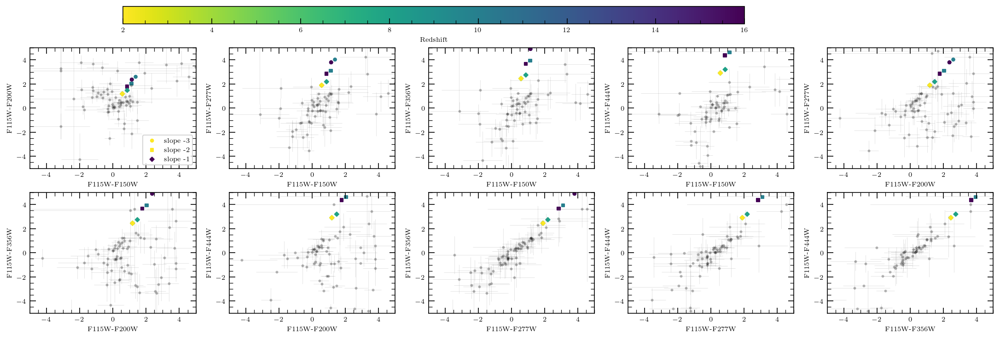

In [134]:
fig, ax = plt.subplots(2, 5, figsize=(18, 5), dpi=150)
# plt.subplots_adjust(wspace=0.1, hspace=0.1)
ax = ax.ravel()
# Pair up the calculated subtractions uniquely for x and y axes
plt_idx = 0
for x in range(len(labels)):
    for y in range(x + 1, len(labels)):
        x_label = labels[x]
        y_label = labels[y]

        x_clr = source_clrs[x]
        y_clr = source_clrs[y]
        x_err = source_clrs_err[x]
        y_err = source_clrs_err[y]

        ax[plt_idx].errorbar(
            x_clr,
            y_clr,
            xerr=x_err,
            yerr=y_err,
            fmt="o",
            markersize=2,
            alpha=0.2,
            c="black",
            ecolor="grey",
            elinewidth=0.5,
        )
        # print(labels_theory[x][0][0])
        # ax[plt_idx].scatter(theory[x], theory[y], s=10,  marker=labels_theory[x][0][0])
        ref_filter_x = x_label.split("-")[0]
        filter_x = x_label.split("-")[1]
        ref_filter_y = y_label.split("-")[0]
        filter_y = y_label.split("-")[1]

        x_theory = get_theory_color(
            ref_filter=ref_filter_x, filter_name=filter_x, slope=-3
        )
        y_theory = get_theory_color(
            ref_filter=ref_filter_y, filter_name=filter_y, slope=-3
        )
        ax[plt_idx].scatter(
            x_theory, y_theory, s=10, marker="o", c=redshifts, label="slope -3"
        )

        x_theory = get_theory_color(
            ref_filter=ref_filter_x, filter_name=filter_x, slope=-2
        )
        y_theory = get_theory_color(
            ref_filter=ref_filter_y, filter_name=filter_y, slope=-2
        )
        ax[plt_idx].scatter(
            x_theory, y_theory, s=10, marker="s", c=redshifts, label="slope -2"
        )

        x_theory = get_theory_color(
            ref_filter=ref_filter_x, filter_name=filter_x, slope=-1
        )
        y_theory = get_theory_color(
            ref_filter=ref_filter_y, filter_name=filter_y, slope=-1
        )
        g = ax[plt_idx].scatter(
            x_theory,
            y_theory,
            s=10,
            marker="D",
            c=redshifts,
            cmap="viridis_r",
            label="slope -1",
        )

        ax[plt_idx].set(
            xlabel=x_label,
            ylabel=y_label,
            xlim=(
                -5,
                5,
            ),
            ylim=(-5, 5),
        )
        plt_idx += 1
ax[0].legend()
cbar_ax = fig.add_axes([0.2, 0.95, 0.5, 0.05])
cbar = fig.colorbar(g, cax=cbar_ax, orientation="horizontal", label="Redshift")
plt.show()

## Section 4: Visual Inspection of Blank sky field galaxy properties

This last part is a visual inspection with the goal of deriving some rough fractional population estimates of AGN, merging and disturbed galaxies in a medium-deep blank sky field (panoramic-j221700p0025) This fraction might be related to the 'duty cycle' of activity of supermassive black holes (SMBH) in galaxies, or the rate at which galaxies hierarchically grow and interact over cosmic time.

To answer these questions you can either:
* use the Legacy Sky Survey viewer link at https://panoramic-jwst.github.io/panoramic_dr1_summary_v0.html for this field (click on the link in the 2nd column in the table), to inspect the color image
* view fits file in a single band in SAOimage.  (This gives you more flexibility in adjusting contrast to see faint features, but lacks benefit of viewing as a pseudo-color composite.)

**Question**: As we have seen, bright point sources will show an airy pattern and significant diffraction wings due to gaps in the segmented mirror (typically in a six-fold or hex pattern). This signature of a bright, point-like source can be useful for identifying QSOs or active galactic nucleus (AGN).  For some objects, we can see apparent light from an extended source, a galaxy, with a central bright source, that is most likely an AGN.   How many AGN candidates can you identify in this field (you can also just use a subsection of the image)?  Estimate the fraction of galaxies that show an AGN signature, by comparing this number to the total number of galaxies in a given region.  

Do this as a rough estimate, you don't need to get an exact count.

> I took a look at 1/8 of the entire panoramic-j221700p0025 field, see below

> and I got to counting extended galaxy-like object with diffraction spikes stemming from the centers. Not counting the bright stars (over exposed with wings), I counted the galaxies with this feature to be 5 such objects in this cropped region. So around 40 potential AGNs in the entire field. 1/4 of this image contains around 50, so this entire cropped region has around 200 galaxies, so around 200 * 8 = 1600 galaxies in the entire field, 40 of which are AGN.


**Question**: Use the same method to estimate the fraction of galaxies that you believe show signatures of active interaction or merging (either close pairs, or highly disturbed with extended tails).

> I see 14 pairs that are either very close or highly disturbed or extended tails, which means around 8*14 = 112 merging systems in this entire field.  


**Question**: Estimate the fraction of galaxies that appear to show signatures of a 'minor merger' or accretion, with faint streams or extended light?  

> I see 10 such systems that appear a little bit elongated with a bit of a light "bridge".

**Summary**: Lastly, briefly critique this method.  Are their reasons why your fractional estimates might be over- or underestimates?  How might they be improved if we used a size, magnitude, or redshift cut?  How might this analysis be automated?   

> There is not a lot of depth information here, so I think I am over-estimating -- two objects that appear close to each other might not necessarily be so. If we use a size cut, we can better distinguish between the foreground and background objects, if we do a magnitude cut, we can better constain distances, confirming whether objects really are near each other or just a projection effect. The redshift cut would also allow to better gauge the distances. Moreover, it can also give us a hint on the nature of the object itself -- if it's likely to be an early or late type galaxy; i.e., if their shapes are just inherently irregular or is it actually being tidally disrupted. 

<img src="./an_8th_of_panmoramic.png" alt="Cropped Region" width="600"/>
<!-- 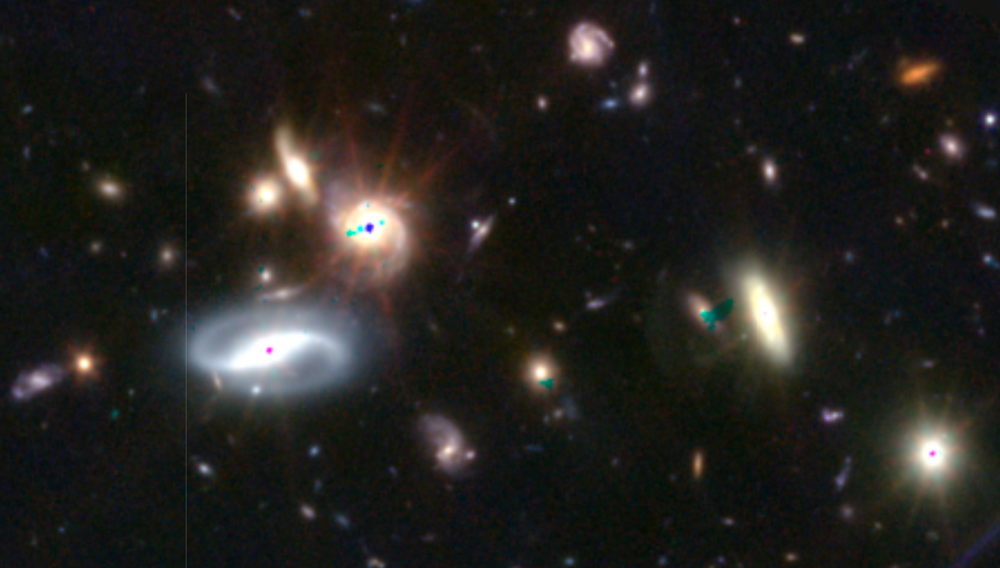 -->